### Урок 7. Детектирование объектов

In [ ]:
# Отмечу сразу - подошел достаточно формально... Использовался пример с TensorFlow 
# https://www.tensorflow.org/hub/tutorials/object_detection
# (он же по сути рассматривался на вебинаре)

In [3]:
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps
import time

In [8]:
def download_and_resize_image(url, width, height):
    _, filename = tempfile.mkstemp(suffix=".jpg")
    response = urlopen(url)
    image_data = response.read()
    image_data = BytesIO(image_data)
    pil_image = Image.open(image_data)
    pil_image = ImageOps.fit(pil_image, (width, height), Image.ANTIALIAS)
    pil_image_rgb = pil_image.convert("RGB")
    pil_image_rgb.save(filename, format="JPEG", quality=90)
    print("Загружен %s." % filename)
    return filename

In [29]:
def draw_bounding_box_on_image(image, ymin, xmin, ymax, xmax, color, font, thickness=4, display_str_list=()):
    draw = ImageDraw.Draw(image)
    im_width, im_height = image.size
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
    draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

    display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
    total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

    if top > total_display_str_height:
        text_bottom = top
    else:
        text_bottom = top + total_display_str_height

    for display_str in display_str_list[::-1]:
        text_width, text_height = font.getsize(display_str)
        margin = np.ceil(0.05 * text_height)
        draw.rectangle([(left, text_bottom - text_height - 2 * margin), (left + text_width, text_bottom)], fill=color)
        draw.text((left + margin, text_bottom - text_height - margin), display_str, fill="black", font=font)
        text_bottom -= text_height - 2 * margin

In [50]:
def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
    colors = list(ImageColor.colormap.values())
    # font = ImageFont.load_default()
    font_path = "/System/Library/Fonts/Supplemental/Arial Unicode.ttf"
    font = ImageFont.truetype(font_path, 22)
    # font = ImageFont.truetype("arial.ttf", 1)

    for i in range(min(boxes.shape[0], max_boxes)):
        if scores[i] >= min_score:
            ymin, xmin, ymax, xmax = tuple(boxes[i])
            display_str = "{}: {}%".format(class_names[i].decode("ascii"), int(100 * scores[i]))
            color = colors[hash(class_names[i]) % len(colors)]
            image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
            draw_bounding_box_on_image(image_pil, ymin, xmin, ymax, xmax, color, font, display_str_list=[display_str])
            np.copyto(image, np.array(image_pil))
    return image

In [35]:
# Фото с яндекс фоток
image_url = "https://deacor.com/wp-content/uploads/2017/01/Cool-Mirror-Decorations-for-Small-Bedroom.jpeg" 
downloaded_image_path = download_and_resize_image(image_url, 1800, 1350)

Загружен /var/folders/06/t7258jd941l9kjxz2j7wkfk80000gn/T/tmp73o0pj0z.jpg.


In [36]:
i = Image.open(downloaded_image_path)

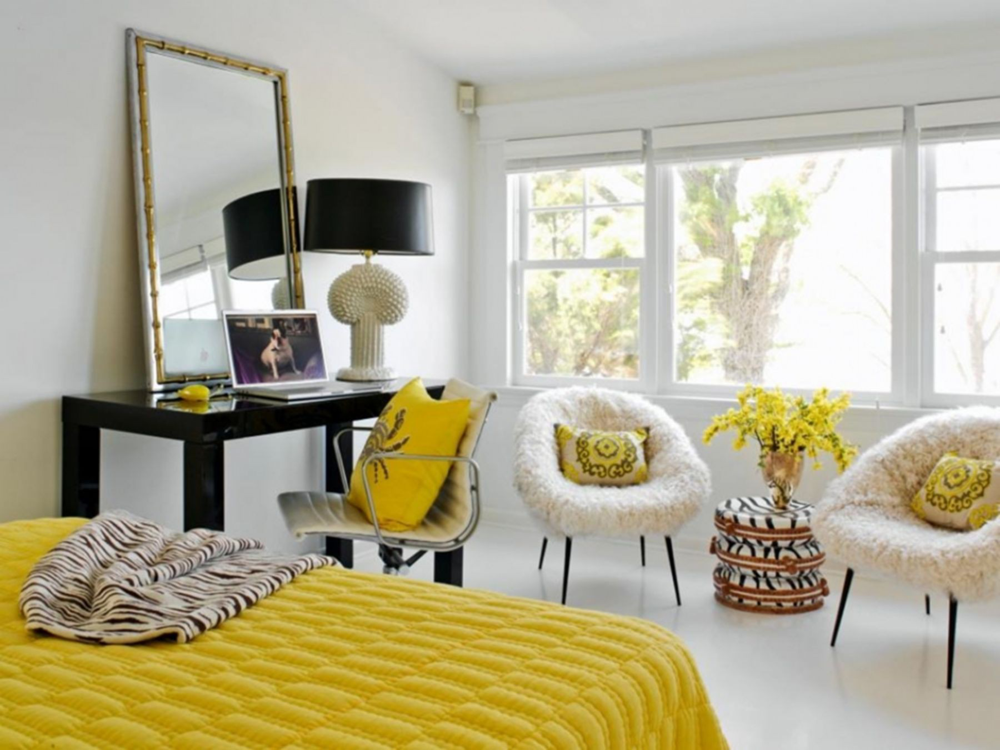

In [37]:
i

In [38]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"
detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [39]:
def load_img(path):
    img = tf.io.read_file(path)
    img = tf.image.decode_jpeg(img, channels=3)
    return img

In [43]:
def run_detector(detector, path):
    img = load_img(path)

    converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
    start_time = time.time()
    result = detector(converted_img)
    end_time = time.time()

    result = {key:value.numpy() for key,value in result.items()}

    print("Found %d objects." % len(result["detection_scores"]))
    print("Inference time: ", end_time-start_time)

    image_with_boxes = draw_boxes(img.numpy(), result["detection_boxes"], result["detection_class_entities"], result["detection_scores"])

    fig = plt.figure(figsize=(20, 15))
    plt.imshow(image_with_boxes)

Found 100 objects.
Inference time:  13.40449833869934


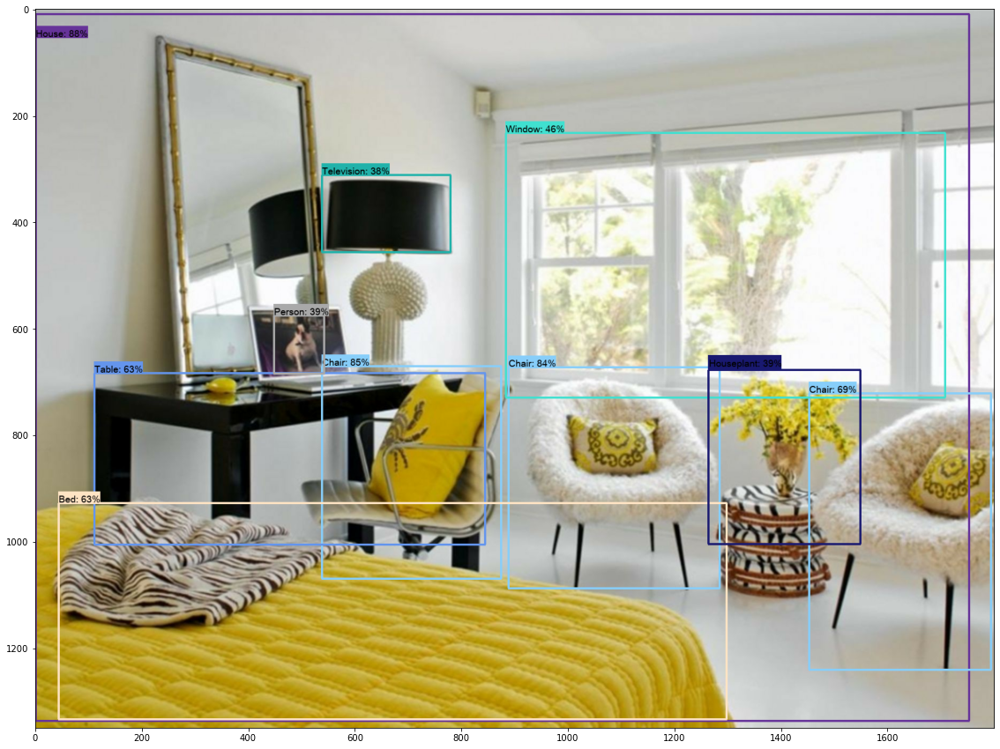

In [46]:
run_detector(detector, downloaded_image_path)

Загружен /var/folders/06/t7258jd941l9kjxz2j7wkfk80000gn/T/tmpwx74i0yp.jpg.


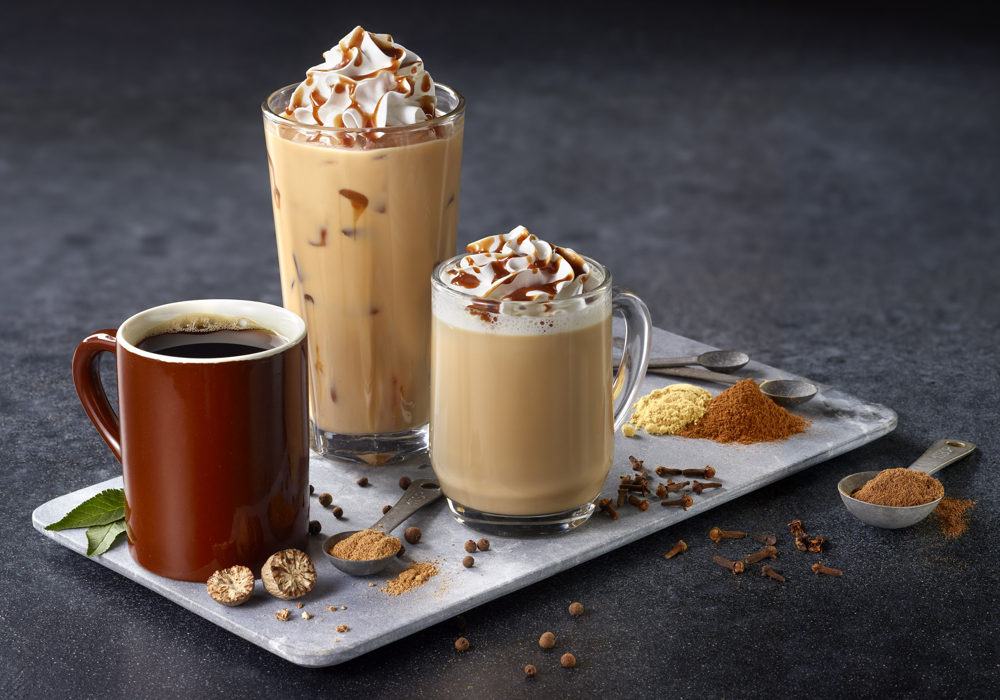

In [47]:
image_url = "https://coffeebrandcenter.com/wp-content/uploads/2019/01/HotColdDrinks_39.jpg" 
downloaded_image_path = download_and_resize_image(image_url, 2740, 1920)
i = Image.open(downloaded_image_path)
i

Found 100 objects.
Inference time:  14.635480165481567


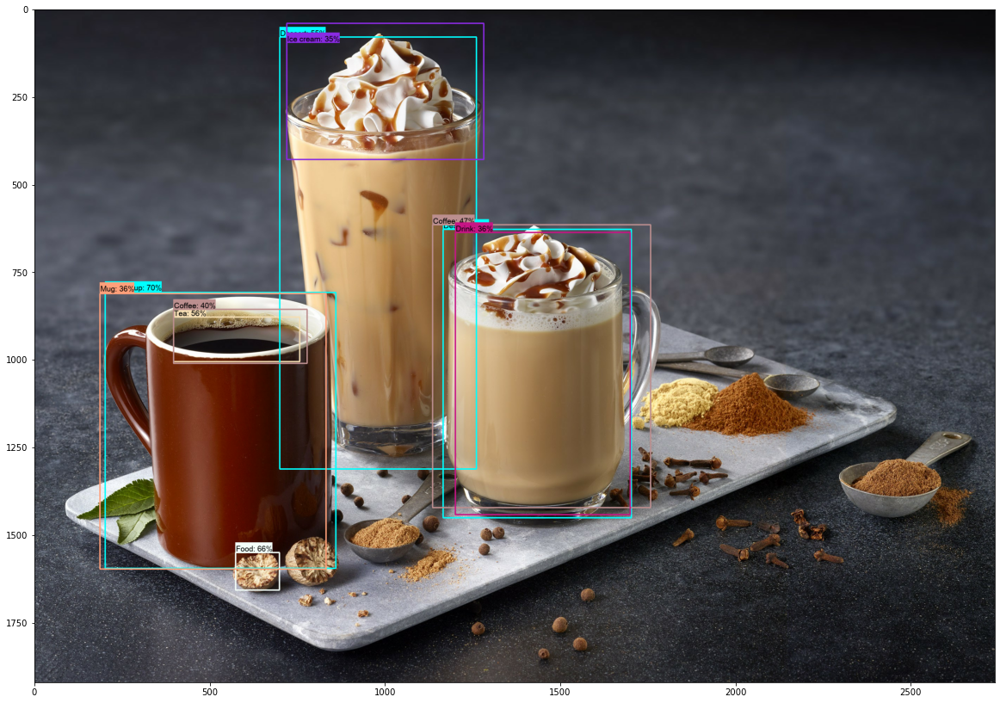

In [51]:
run_detector(detector, downloaded_image_path)

Загружен /var/folders/06/t7258jd941l9kjxz2j7wkfk80000gn/T/tmpi63ya739.jpg.


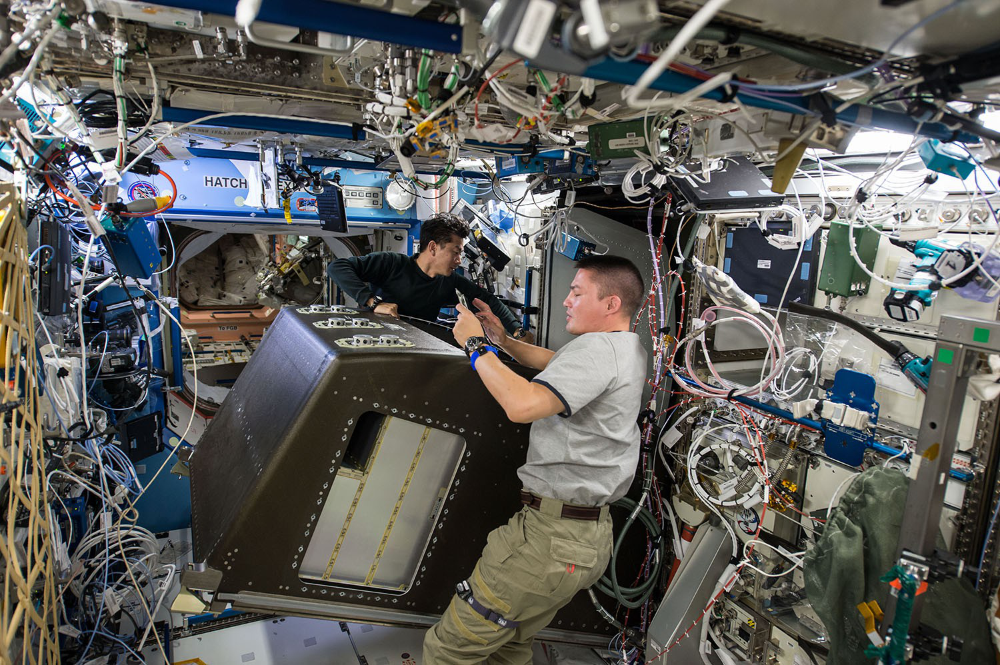

In [52]:
image_url = "https://www.spaceflightinsider.com/wp-content/uploads/2015/10/Destiny_Rackmove.jpg" 
downloaded_image_path = download_and_resize_image(image_url, 1500, 998)
i = Image.open(downloaded_image_path)
i

Found 100 objects.
Inference time:  12.542837858200073


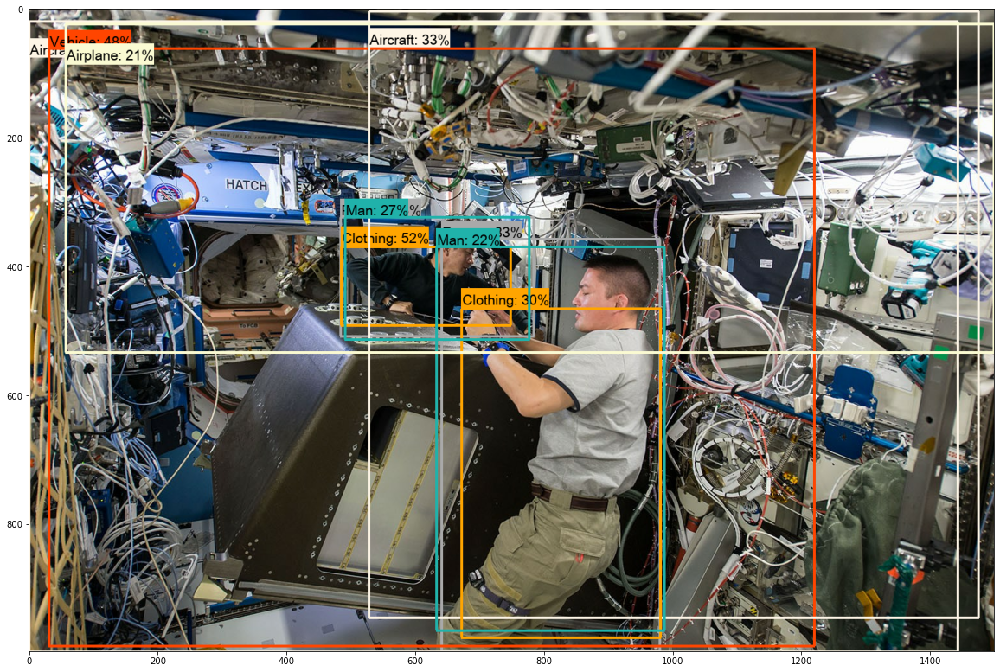

In [53]:
run_detector(detector, downloaded_image_path)

Загружен /var/folders/06/t7258jd941l9kjxz2j7wkfk80000gn/T/tmpve1uzhg5.jpg.
Found 100 objects.
Inference time:  12.273059129714966


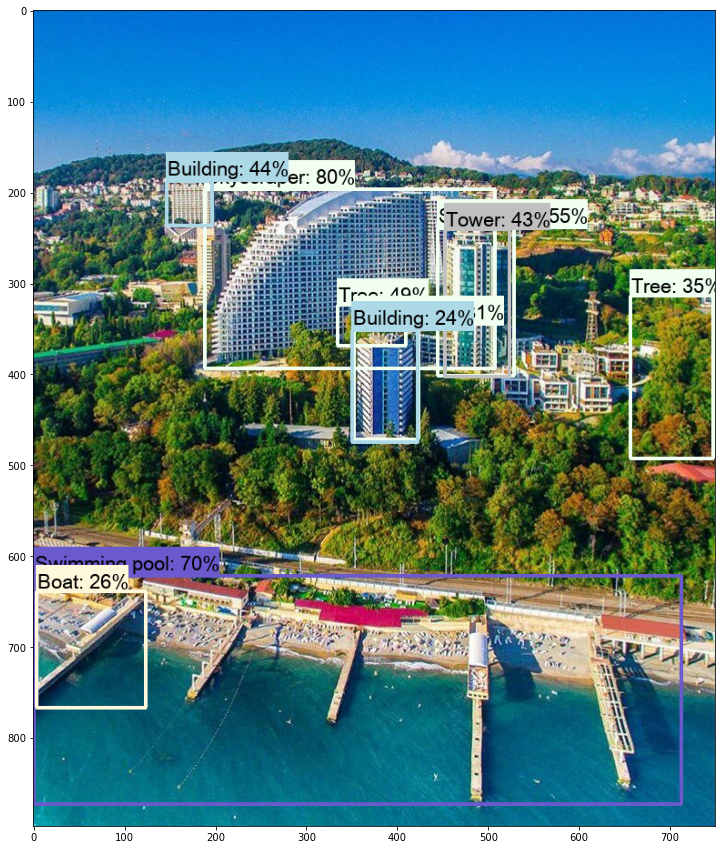

In [54]:
image_url = "https://pbs.twimg.com/media/DP5UggOW0AANf4X.jpg:large" 
downloaded_image_path = download_and_resize_image(image_url, 750, 897)
i = Image.open(downloaded_image_path)
i
run_detector(detector, downloaded_image_path)

In [55]:
# Неиссякаемый источник веселья ))

В связи с этим вопрос (уже задавал его на последней лекции - но он как выяснилось - остался актуальным. Здесь все фото - разных размеров и форматов. Мы не приводим их к какому-то единому размеру перед отправкой в детектор. Как работает сеть которая занимается распознаванием? Она же имеет какой-то входной размер? Или она конфигурируется "на лету" под любой размер фотки? (ну то-есть скажем решающая (уже обученная часть) прицепляется для каждой фотки к инпуту соответственного размера.. То-есть по факту мы постоянно перестраиваем сеть под каждое фото?

Или у этой сети есть некий входной слой - который каким-то образом на лету подгоняет фото под формат сети?